<a href="https://colab.research.google.com/github/cmsaravanan99/mini-project/blob/main/ExtractingFrames.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import glob
import os
import time
import random
import requests
import sys
import shutil

#from azure import video_details

#from dotenv import load_dotenv
from IPython.display import Image
from matplotlib import pyplot as plt
from PIL import Image as PILImage
from tqdm import tqdm
from IPython.display import Video

# New Section

In [2]:
HOME_DIR = os.getcwd()
HOME_DIR

'/content'

In [3]:
VIDEO_DIR = "videos"

In [4]:
if os.path.exists(VIDEO_DIR):
    shutil.rmtree(VIDEO_DIR)

print("Creating directory")
os.makedirs(VIDEO_DIR, exist_ok=True)
print("Done")

Creating directory
Done


In [5]:
FRAMES_DIR = "frames"

In [6]:
if os.path.exists(FRAMES_DIR):
    print("Deleting the frames dir...\n")
    shutil.rmtree(FRAMES_DIR)
    print("Done")

print("Creating directory")
os.makedirs(FRAMES_DIR, exist_ok=True)
print("Done")

Creating directory
Done


In [10]:
!ls $VIDEO_DIR/inputvideo.mp4 -lh

-rw-r--r-- 1 root root 66M Apr 27 04:10 videos/inputvideo.mp4


In [11]:
video_extensions = (".mp4", ".avi", ".mpg")

videos_list = [
    os.path.join(VIDEO_DIR, f)
    for f in os.listdir(VIDEO_DIR)
    if os.path.splitext(f)[1].lower() in video_extensions
]

videos_list

['videos/inputvideo.mp4']

In [12]:
video_file = videos_list[0]

Video(video_file, width=860)

In [13]:
def video_details(video_filename):
    """
    Video information
    """
    cap = cv2.VideoCapture(video_filename)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    nbframes = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = nbframes / fps

    print(f"Video filename: {video_filename}")
    print(f"Video duration in secs = {duration:.2f} seconds")
    print(f"Frames per second: {fps}")
    print(f"Total number of frames: {nbframes}")

    return duration, fps, nbframes

In [14]:
duration, fps, nbframes = video_details(video_file)

Video filename: videos/inputvideo.mp4
Video duration in secs = 1918.13 seconds
Frames per second: 23
Total number of frames: 44117


In [15]:
frame_count = 0  # do not change
duration = 0  # do not change

jpg_quality = 100  # quality percent of the jpg files

video = cv2.VideoCapture(video_file)
print("Extracting frames from the video...")

progress_bar = tqdm(total=nbframes)

while True:
    ret, frame = video.read()

    if not ret:
        break

    if frame_count % (fps) == 0:  # 1 frame per each second of the video
        hours, remainder = divmod(duration, 3600)
        minutes, seconds = divmod(remainder, 60)
        # videofile name
        cv2.putText(
            frame,
            f"{video_file}",
            (50, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 0, 255),
            2,
        )
        # timeframe
        cv2.putText(
            frame,
            f"{hours:02d} hour {minutes:02d} min {seconds:02d} secs",
            (50, 60),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 0, 255),
            2,
        )

        # Saving frames
        time_string = f"{hours:02d}_{minutes:02d}_{seconds:02d}"
        cv2.imwrite(
            FRAMES_DIR + "/" + f"frame_{time_string}.jpg",
            frame,
            [cv2.IMWRITE_JPEG_QUALITY, jpg_quality],
        )

        duration += 1

    frame_count += 1
    progress_bar.update(1)

progress_bar.close()

print("\nDone")
print("Number of processed frames =", nbframes)
print("Number of saved frames =", len(os.listdir(FRAMES_DIR)))

Extracting frames from the video...


100%|██████████| 44117/44117 [03:25<00:00, 214.61it/s]


Done
Number of processed frames = 44117
Number of saved frames = 1919


In [16]:
frames = [file for file in glob.glob(FRAMES_DIR + "/*.jpg")]

print("Number of frames =", len(frames))

Number of frames = 1919


frames/frame_00_29_48.jpg


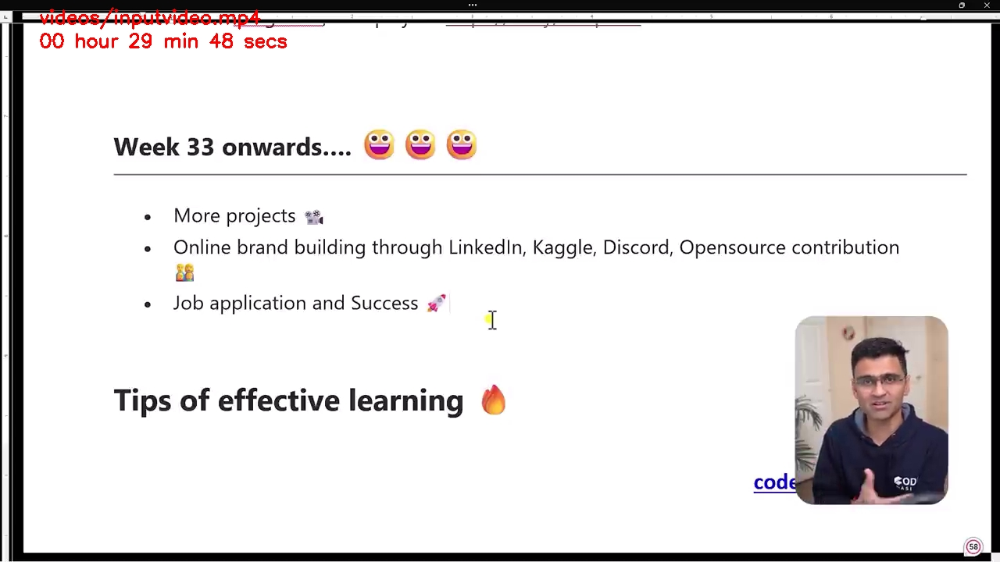

In [17]:
imageid = random.randint(0, len(frames))

print(frames[imageid])
Image(filename=frames[imageid], width=640)

frames/frame_00_29_48.jpg


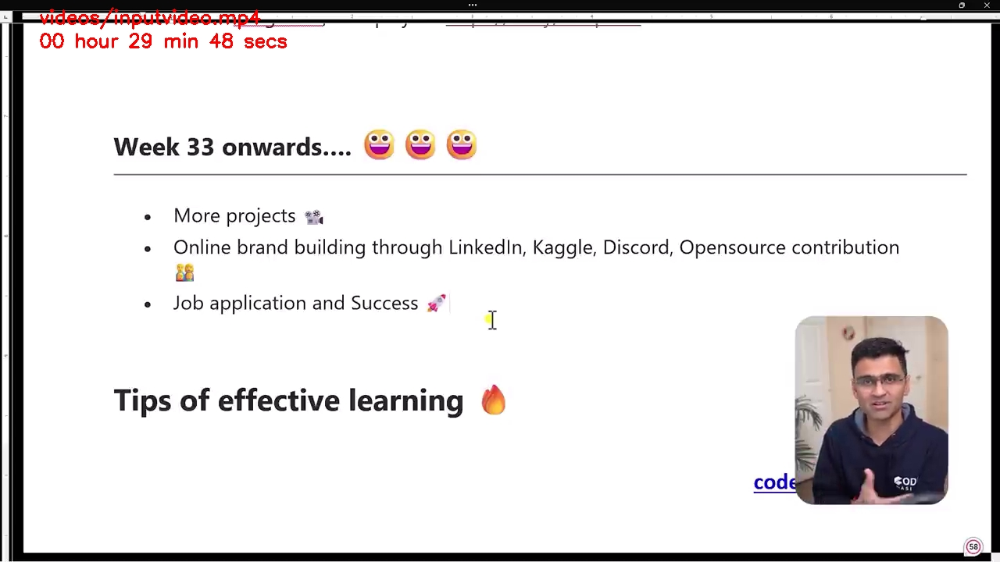

In [18]:
imageid = random.randint(0, len(frames))

print(frames[imageid])
Image(filename=frames[imageid], width=640)

frames/frame_00_00_36.jpg


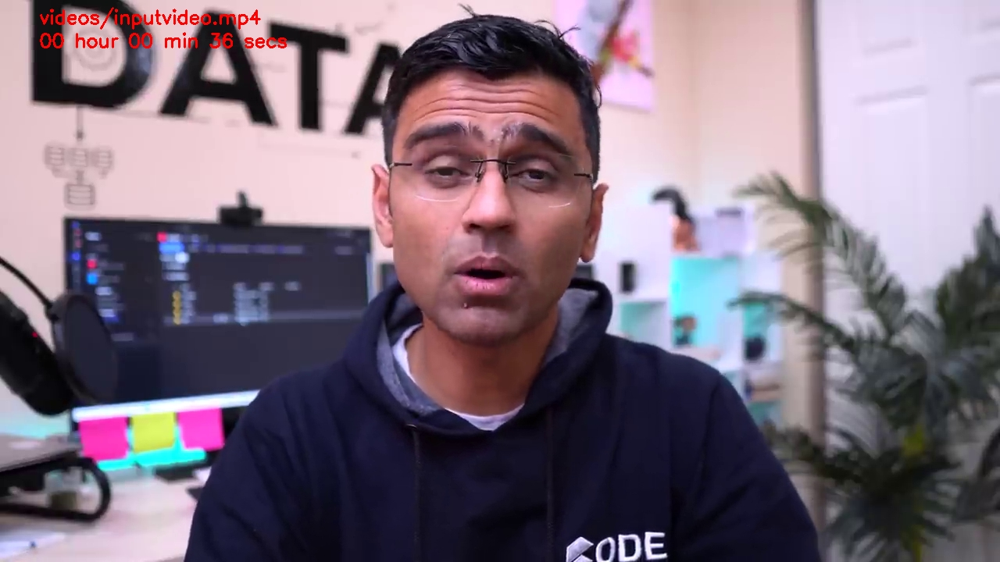

In [19]:
imageid = random.randint(0, len(frames))

print(frames[imageid])
Image(filename=frames[imageid], width=640)

frames/frame_00_00_54.jpg


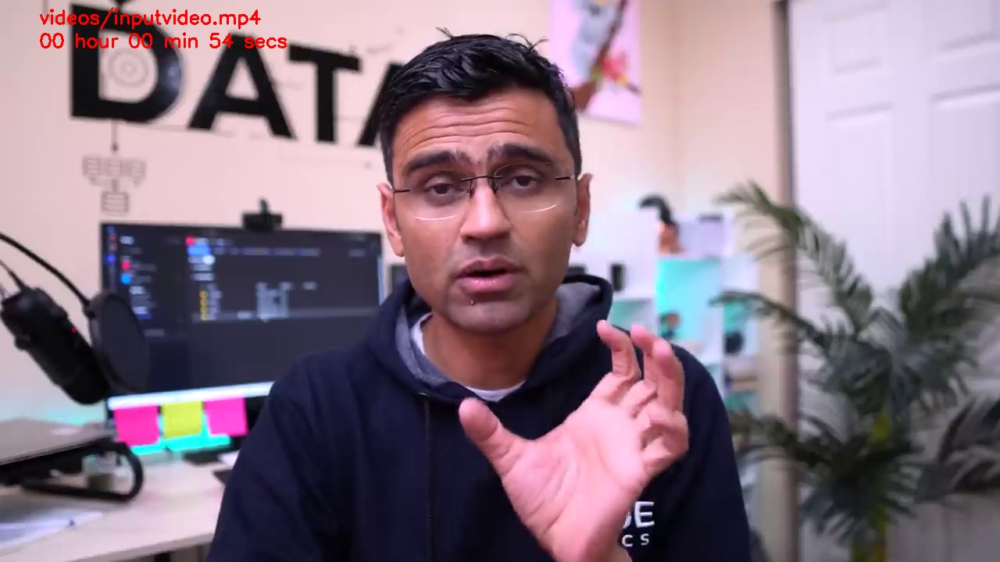

In [20]:
imageid = random.randint(0, len(frames))

print(frames[imageid])
Image(filename=frames[imageid], width=640)

frames/frame_00_24_53.jpg


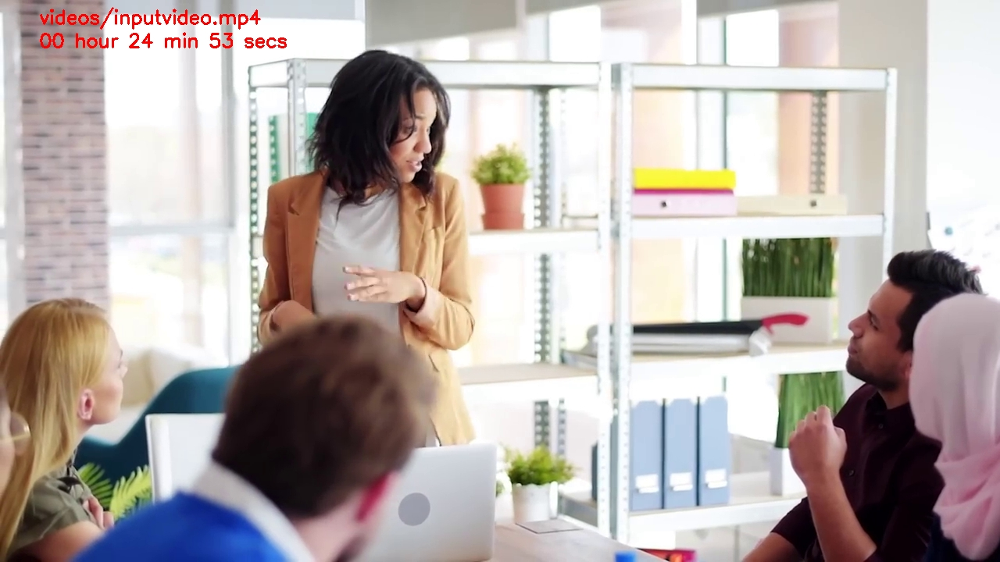

In [21]:
imageid = random.randint(0, len(frames))

print(frames[imageid])
Image(filename=frames[imageid], width=640)

In [25]:
azure_cv_key = "3966ac817eaf4238b0eecbe7239c3b5f"
azure_cv_key2 = "7edf5ce55d44461c88daece3d7da2e25"
azure_cv_endpoint = "https://aivideopoc.cognitiveservices.azure.com/"


In [26]:
features = "&features=tags,read,caption,denseCaptions,smartCrops,objects,people"

url = (
    azure_cv_endpoint
    + "/computervision/imageanalysis:analyze?api-version=2023-02-01-preview"
    + features
)

headers = {
    "Content-type": "application/octet-stream",
    "Ocp-Apim-Subscription-Key": azure_cv_key,
}

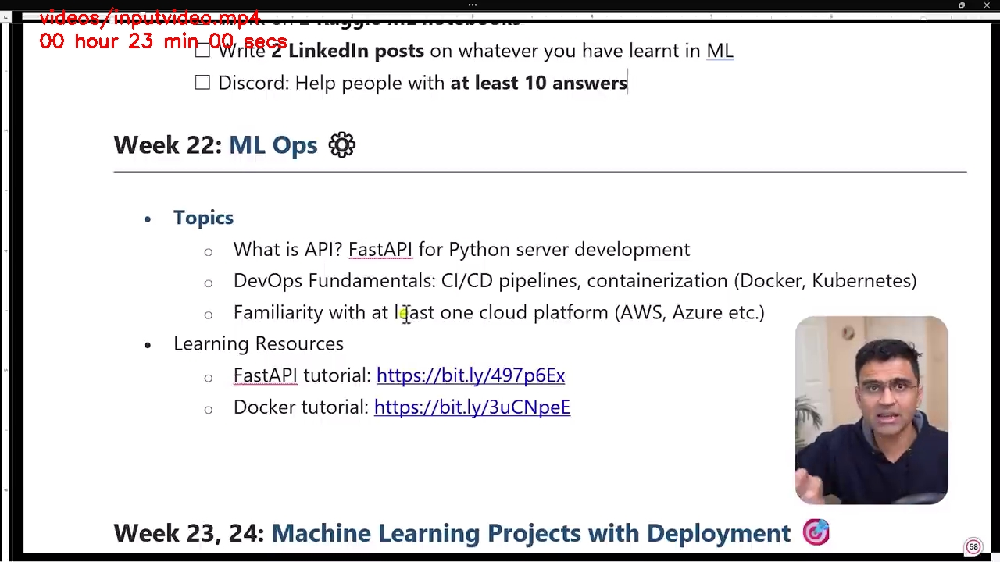

In [27]:
sample_image = "frames/frame_00_23_00.jpg"
Image(filename=sample_image, width=640)

In [28]:
with open(sample_image, "rb") as file:
    img = file.read()

results = requests.post(url, data=img, headers=headers)
results.json()

{'captionResult': {'text': 'a screenshot of a computer',
  'confidence': 0.8057972192764282},
 'objectsResult': {'values': [{'boundingBox': {'x': 1020,
     'y': 429,
     'w': 205,
     'h': 237},
    'tags': [{'name': 'person', 'confidence': 0.786}]}]},
 'readResult': {'stringIndexType': 'TextElements',
  'content': 'videos / inputvideo.mp4.\n00 hour 23 min 00 seCSLinkedIn posts on whatever you have learnt in ML\nDiscord: Help people with at least 10 answers\nWeek 22: ML Ops\n· Topics\nO\nWhat is API? FastAPI for Python server development\n0\nDevOps Fundamentals: CI/CD pipelines, containerization (Docker, Kubernetes)\n0\nFamiliarity with at last one cloud platform (AWS, Azure etc.)\n· Learning Resources\nO\nFastAPI tutorial: https://bit.ly/497p6Ex\n0\nDocker tutorial: https://bit.ly/3uCNpeE\nWeek 23, 24: Machine Learning Projects with Deployment\n58',
  'pages': [{'height': 720.0,
    'width': 1280.0,
    'angle': 0.0326,
    'pageNumber': 1,
    'words': [{'content': 'videos',
     

In [29]:
caption = results.json()["captionResult"]
caption

{'text': 'a screenshot of a computer', 'confidence': 0.8057972192764282}

In [30]:
caption["text"]

'a screenshot of a computer'

In [31]:
ocr = results.json()["readResult"]
ocr

{'stringIndexType': 'TextElements',
 'content': 'videos / inputvideo.mp4.\n00 hour 23 min 00 seCSLinkedIn posts on whatever you have learnt in ML\nDiscord: Help people with at least 10 answers\nWeek 22: ML Ops\n· Topics\nO\nWhat is API? FastAPI for Python server development\n0\nDevOps Fundamentals: CI/CD pipelines, containerization (Docker, Kubernetes)\n0\nFamiliarity with at last one cloud platform (AWS, Azure etc.)\n· Learning Resources\nO\nFastAPI tutorial: https://bit.ly/497p6Ex\n0\nDocker tutorial: https://bit.ly/3uCNpeE\nWeek 23, 24: Machine Learning Projects with Deployment\n58',
 'pages': [{'height': 720.0,
   'width': 1280.0,
   'angle': 0.0326,
   'pageNumber': 1,
   'words': [{'content': 'videos',
     'boundingBox': [47.0, 13.0, 125.0, 12.0, 125.0, 36.0, 46.0, 36.0],
     'confidence': 0.993,
     'span': {'offset': 0, 'length': 6}},
    {'content': '/',
     'boundingBox': [132.0, 12.0, 138.0, 12.0, 138.0, 36.0, 132.0, 36.0],
     'confidence': 0.885,
     'span': {'offset

In [32]:
print(ocr["content"])

videos / inputvideo.mp4.
00 hour 23 min 00 seCSLinkedIn posts on whatever you have learnt in ML
Discord: Help people with at least 10 answers
Week 22: ML Ops
· Topics
O
What is API? FastAPI for Python server development
0
DevOps Fundamentals: CI/CD pipelines, containerization (Docker, Kubernetes)
0
Familiarity with at last one cloud platform (AWS, Azure etc.)
· Learning Resources
O
FastAPI tutorial: https://bit.ly/497p6Ex
0
Docker tutorial: https://bit.ly/3uCNpeE
Week 23, 24: Machine Learning Projects with Deployment
58


In [33]:
densecaptions = results.json()["denseCaptionsResult"]
densecaptions

{'values': [{'text': 'a screenshot of a computer',
   'confidence': 0.8059360980987549,
   'boundingBox': {'x': 0, 'y': 0, 'w': 1280, 'h': 720}},
  {'text': 'a man wearing glasses and a blue shirt',
   'confidence': 0.7022598385810852,
   'boundingBox': {'x': 1013, 'y': 424, 'w': 199, 'h': 221}},
  {'text': 'a screenshot of a computer',
   'confidence': 0.8199210166931152,
   'boundingBox': {'x': 1, 'y': 0, 'w': 1262, 'h': 698}},
  {'text': 'a man with glasses making a face',
   'confidence': 0.7132342457771301,
   'boundingBox': {'x': 1079, 'y': 425, 'w': 109, 'h': 146}},
  {'text': 'a close up of a sign',
   'confidence': 0.6534664630889893,
   'boundingBox': {'x': 41, 'y': 4, 'w': 320, 'h': 63}},
  {'text': 'a black and blue text',
   'confidence': 0.7159761190414429,
   'boundingBox': {'x': 134, 'y': 153, 'w': 322, 'h': 60}}]}

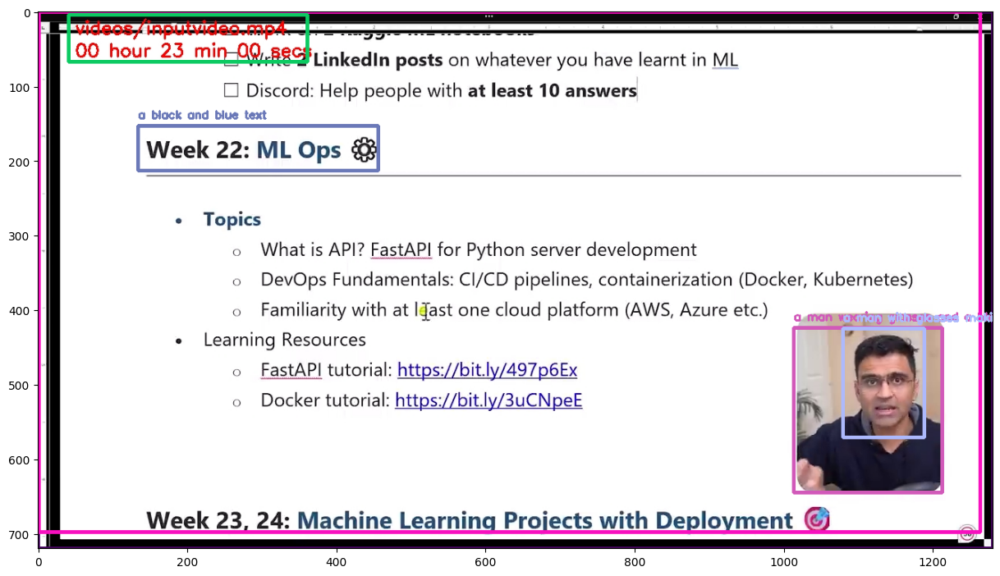

In [34]:
image = cv2.imread(sample_image)

for obj in densecaptions["values"]:
    label = obj["text"]
    x = obj["boundingBox"]["x"]
    y = obj["boundingBox"]["y"]
    w = obj["boundingBox"]["w"]
    h = obj["boundingBox"]["h"]

    col1 = random.randint(0, 255)
    col2 = random.randint(0, 255)
    col3 = random.randint(0, 255)

    cv2.rectangle(
        image,
        (x, y),
        (x + w, y + h),
        (col1, col2, col3),
        3,
    )
    cv2.putText(
        image,
        label,
        (x, y - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        (col1, col2, col3),
        2,
    )

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [35]:
tags = results.json()["tagsResult"]["values"]
tags

[{'name': 'text', 'confidence': 0.9998952150344849},
 {'name': 'human face', 'confidence': 0.9855335354804993},
 {'name': 'man', 'confidence': 0.9850602746009827},
 {'name': 'screenshot', 'confidence': 0.9776082038879395},
 {'name': 'website', 'confidence': 0.8828355073928833},
 {'name': 'web page', 'confidence': 0.8756418228149414},
 {'name': 'clothing', 'confidence': 0.8687517642974854},
 {'name': 'person', 'confidence': 0.6607507467269897}]

In [36]:
for i, tag in enumerate(tags):
    tag_name = tag["name"]
    confidence = tag["confidence"]
    print(tag_name, "=", confidence)

text = 0.9998952150344849
human face = 0.9855335354804993
man = 0.9850602746009827
screenshot = 0.9776082038879395
website = 0.8828355073928833
web page = 0.8756418228149414
clothing = 0.8687517642974854
person = 0.6607507467269897


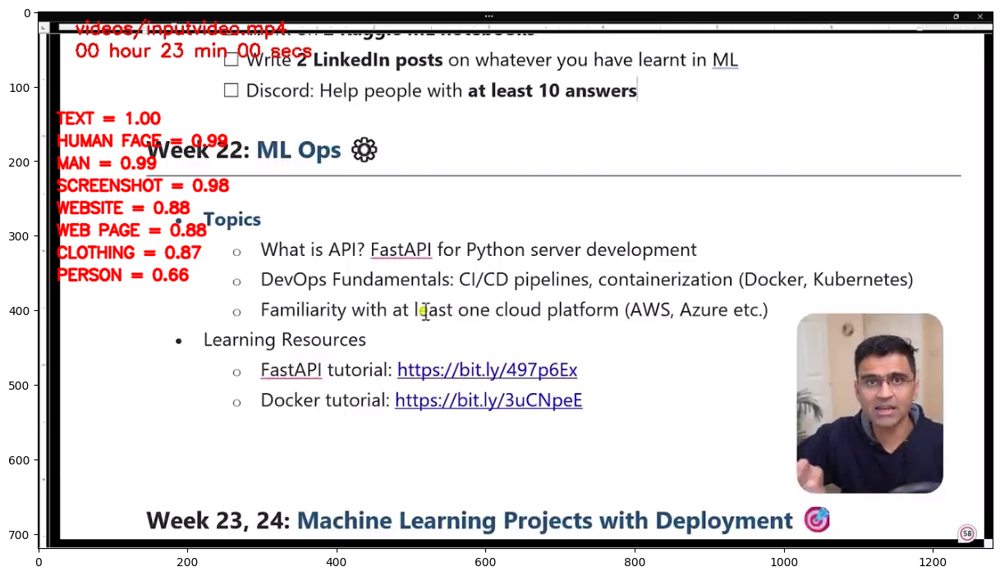

In [37]:
image = cv2.imread(sample_image)
text_position = (25, 150)

# Iterate over the tag data and display name and confidence
for i, tag in enumerate(tags):
    tag_name = tag["name"]
    confidence = tag["confidence"]

    text = f"{str.upper(tag_name)} = {confidence:.2f}"
    position = (text_position[0], text_position[1] + i * 30)

    cv2.putText(
        image,
        text,
        position,
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (0, 0, 255),
        2,
        cv2.LINE_AA,
    )

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [38]:
crop = results.json()["smartCropsResult"]
crop["values"]

[{'aspectRatio': 1.78, 'boundingBox': {'x': 53, 'y': 30, 'w': 1174, 'h': 660}}]

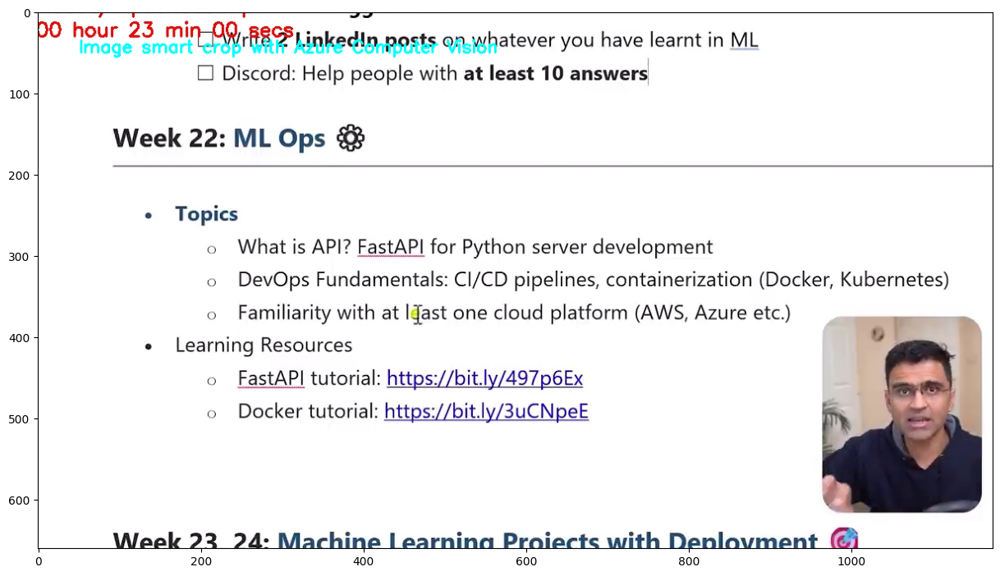

In [39]:
image = cv2.imread(sample_image)

x = crop["values"][0]["boundingBox"]["x"]
y = crop["values"][0]["boundingBox"]["y"]
width = crop["values"][0]["boundingBox"]["w"]
height = crop["values"][0]["boundingBox"]["h"]

# Crop the image using the bounding box coordinates
cropped_image = image[y : y + height, x : x + width]

cv2.putText(
    cropped_image,
    "Image smart crop with Azure Computer Vision",
    (50, 50),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7,
    (255, 255, 0),
    2,
)

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))

In [40]:
objects = results.json()["objectsResult"]["values"]
objects

[{'boundingBox': {'x': 1020, 'y': 429, 'w': 205, 'h': 237},
  'tags': [{'name': 'person', 'confidence': 0.786}]}]

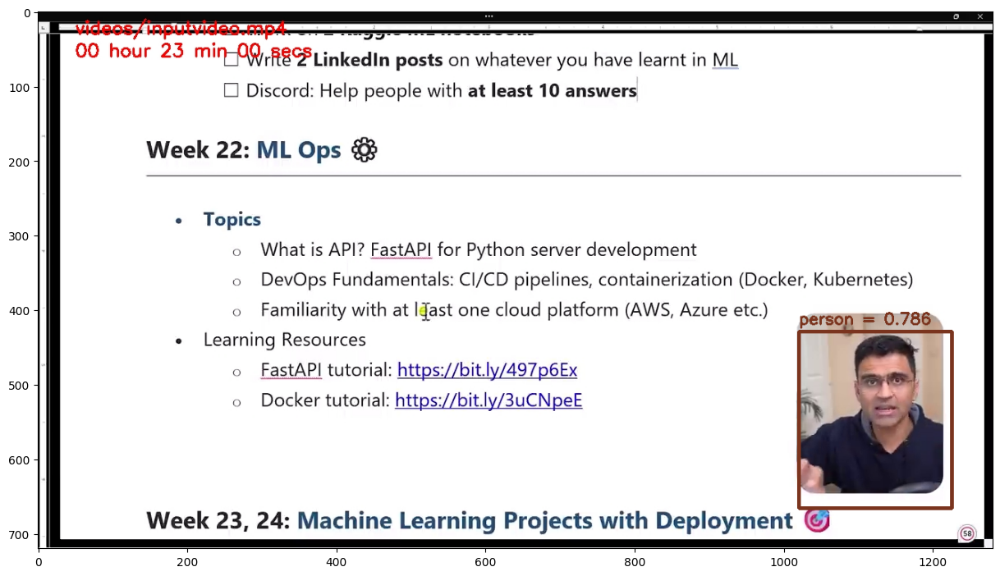

In [41]:
image = cv2.imread(sample_image)

for item in objects:
    tags = item["tags"]

    for tag in tags:
        tag_name = tag["name"]
        conf = tag["confidence"]

    col1 = random.randint(0, 255)
    col2 = random.randint(0, 255)
    col3 = random.randint(0, 255)

    x = item["boundingBox"]["x"]
    y = item["boundingBox"]["y"]
    w = item["boundingBox"]["w"]
    h = item["boundingBox"]["h"]

    text = tag_name + " = " + str(conf)
    cv2.rectangle(image, (x, y), (x + w, y + h),
                  (col1, col2, col3), 3)
    cv2.putText(
        image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
        0.7, (col1, col2, col3), 2
    )

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [42]:
people = results.json()["peopleResult"]["values"]
people

[{'boundingBox': {'x': 1016, 'y': 430, 'w': 200, 'h': 217},
  'confidence': 0.6779991984367371}]

In [43]:
nbpersons = 0
minconf = 0.2

for item in people:
    confidence = item["confidence"]

    if confidence >= minconf:
        bounding_box = item["boundingBox"]
        x = bounding_box["x"]
        y = bounding_box["y"]
        w = bounding_box["w"]
        h = bounding_box["h"]

        print(
            nbpersons + 1,
            f"Person with confidence = {confidence:.2f}\nx = {x} y = {y} w = {w} h = {h}\n",
        )
        nbpersons += 1

1 Person with confidence = 0.68
x = 1016 y = 430 w = 200 h = 217



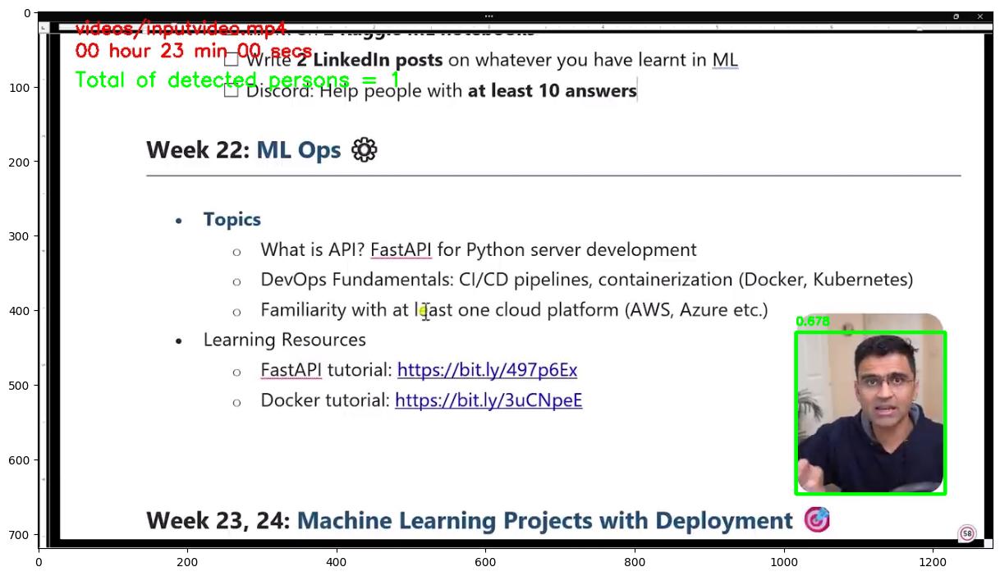

In [44]:
image = cv2.imread(sample_image)

for item in people:
    confidence = item["confidence"]

    if confidence >= minconf:
        bounding_box = item["boundingBox"]
        x = bounding_box["x"]
        y = bounding_box["y"]
        w = bounding_box["w"]
        h = bounding_box["h"]
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)
        text = str(round(confidence, 3))
        cv2.putText(
            image,
            "Total of detected persons = " + str(nbpersons),
            (50, 100),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.9,
            (0, 255, 0),
            2,
        )
        cv2.putText(
            image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
            (0, 255, 0), 2
        )

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [47]:
import datetime
import os
import sys
import urllib
from cleanvision.imagelab import Imagelab
#from dotenv import load_dotenv
from PIL import Image

In [48]:
IMAGES_DIR = "frames"

os.makedirs(IMAGES_DIR, exist_ok=True)

In [49]:
image_extensions = [".jpg", ".jpeg", ".png"]

image_files = [
    os.path.join(IMAGES_DIR, f)
    for f in os.listdir(IMAGES_DIR)
    if os.path.splitext(f)[1] in image_extensions
]

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,919


In [51]:
key = "3966ac817eaf4238b0eecbe7239c3b5f"
azure_cv_key2 = "7edf5ce55d44461c88daece3d7da2e25"
endpoint = "https://aivideopoc.cognitiveservices.azure.com/"

In [52]:
def view_image(image_file):
    """
    View image file
    """
    plt.imshow(Image.open(image_file))
    plt.axis('off')
    plt.title("Image: " + image_file, fontdict={'fontsize': 10})
    plt.show()


def describe_image_with_AzureCV4(image_file):
    """
    Get tags & caption from an image using Azure Computer Vision 4 Florence
    """
    options = "&features=tags,caption"
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/imageanalysis:analyze" + model + options

    headers_cv = {
        'Content-type': 'application/octet-stream',
        'Ocp-Apim-Subscription-Key': key
    }

    with open(image_file, 'rb') as f:
        data = f.read()

    r = requests.post(url, data=data, headers=headers_cv)
    results = r.json()

    print("Automatic analysis of the image using Azure Computer Vision 4.0:")
    print("\033[1;31;34m")
    print("   Main caption:")
    print(
        f"    {results['captionResult']['text']} = {results['captionResult']['confidence']:.3f}"
    )

    print("\033[1;31;32m")
    print("   Detected tags:")
    for tag in results['tagsResult']['values']:
        print(f"    {tag['name']:18} = {tag['confidence']:.3f}")

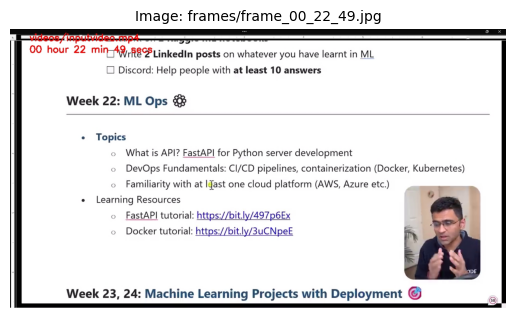

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a screenshot of a computer = 0.819

   Detected tags:
    text               = 1.000
    electronics        = 0.996
    human face         = 0.994
    screenshot         = 0.979
    person             = 0.972
    man                = 0.966
    clothing           = 0.883
    website            = 0.875
    web page           = 0.859


In [53]:
idx = 10

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

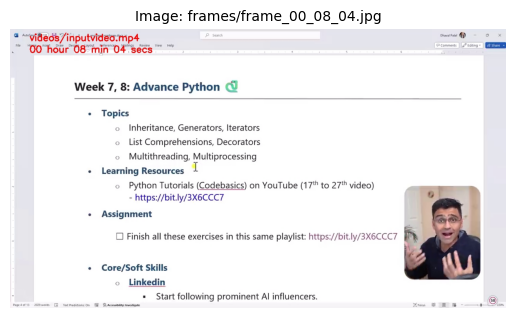

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a screenshot of a computer = 0.859

   Detected tags:
    text               = 1.000
    electronics        = 0.993
    human face         = 0.983
    screenshot         = 0.979
    man                = 0.963
    person             = 0.938
    website            = 0.921
    web page           = 0.918
    software           = 0.913
    online advertising = 0.873
    computer icon      = 0.842


In [54]:
idx = 1300

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

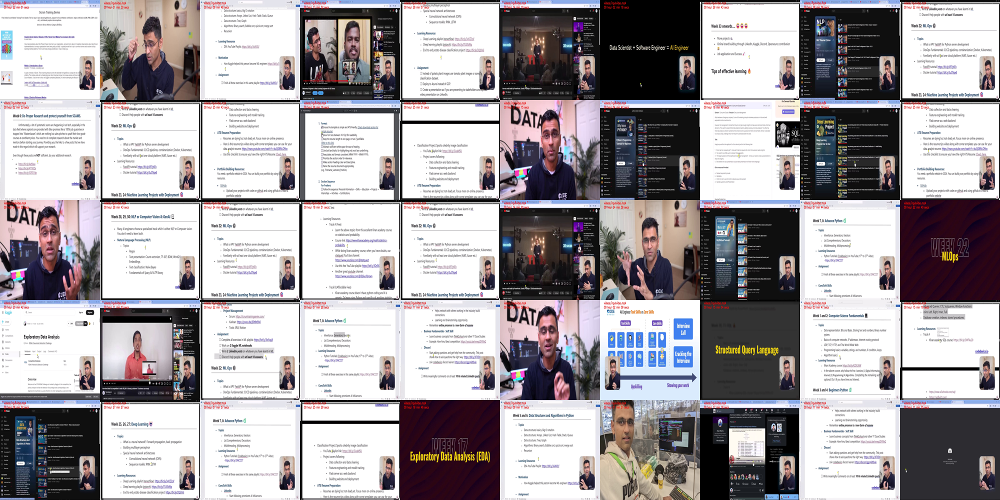

In [55]:
num_images_per_row = 10
num_images_per_col = 5
img_size = 200
start = 1

samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

# Load and resize the images
sample_images = [
    Image.open(image_file).resize((img_size, img_size)) for image_file in samples
]

# Paste the images onto the new image
for idx, img in enumerate(sample_images):
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

In [56]:
imagelab = Imagelab(data_path=IMAGES_DIR)

Reading images from /content/frames


Sample images from the dataset


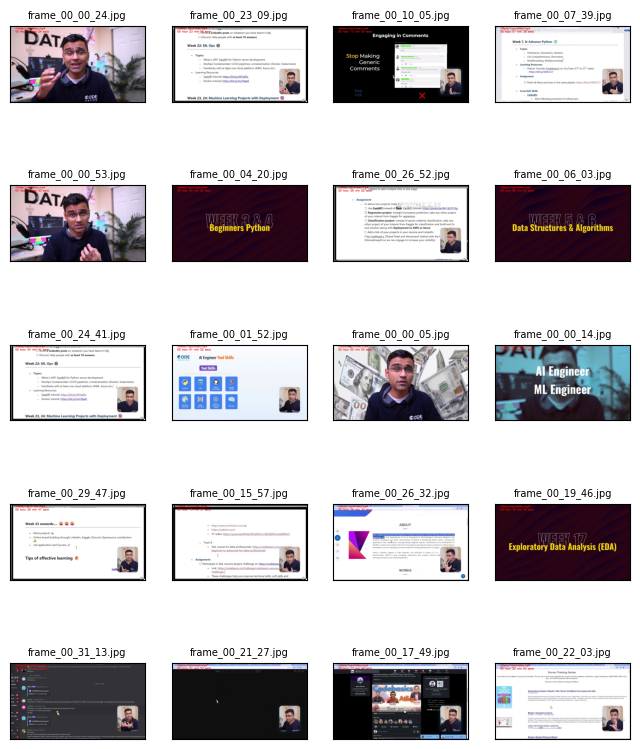

In [57]:
imagelab.visualize(num_images=20)

In [58]:
imagelab.find_issues()

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/1919 [00:00<?, ?it/s]

  0%|          | 0/1919 [00:00<?, ?it/s]

Issue checks completed. 1271 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().


Removing near_duplicates from potential issues in the dataset as it exceeds max_prevalence=0.5 
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  1 | low_information  |           17 |
|  2 | dark             |            6 |
|  3 | blurry           |            0 |
|  4 | grayscale        |            0 |
|  5 | light            |            0 |
|  6 | odd_aspect_ratio |            0 |
|  7 | odd_size         |            0 |
|  8 | exact_duplicates |            0 | 

------------------ low_information images ------------------

Number of examples with this issue: 17
Examples representing most severe instances of this issue:



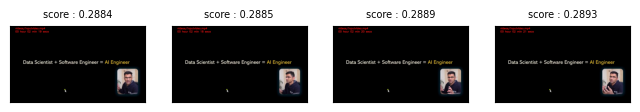

----------------------- dark images ------------------------

Number of examples with this issue: 6
Examples representing most severe instances of this issue:



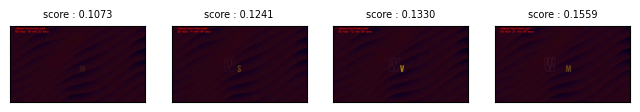

In [59]:
imagelab.report()

In [60]:
imagelab.issue_summary

,issue_type,num_images
0,near_duplicates,1248
1,low_information,17
2,dark,6
3,blurry,0
4,grayscale,0
5,light,0
6,odd_aspect_ratio,0
7,odd_size,0
8,exact_duplicates,0


In [61]:
imagelab.report(["near_duplicates"])

Removing near_duplicates from potential issues in the dataset as it exceeds max_prevalence=0.5 
Please specify some issue_types to check for in imagelab.find_issues().


In [62]:
imagelab.issues.head()

,odd_size_score,is_odd_size_issue,odd_aspect_ratio_score,is_odd_aspect_ratio_issue,low_information_score,is_low_information_issue,light_score,is_light_issue,grayscale_score,is_grayscale_issue,dark_score,is_dark_issue,blurry_score,is_blurry_issue,exact_duplicates_score,is_exact_duplicates_issue,near_duplicates_score,is_near_duplicates_issue
/content/frames/frame_00_00_00.jpg,1.0,False,0.5625,False,0.927182,False,0.952588,False,1,False,0.894184,False,0.584010,False,1.0,False,0.333333,True
/content/frames/frame_00_00_01.jpg,1.0,False,0.5625,False,0.927406,False,0.952007,False,1,False,0.893854,False,0.581072,False,1.0,False,0.500000,True
/content/frames/frame_00_00_02.jpg,1.0,False,0.5625,False,0.746588,False,0.813509,False,1,False,1.000000,False,0.898880,False,1.0,False,1.000000,False
/content/frames/frame_00_00_03.jpg,1.0,False,0.5625,False,0.930484,False,0.945202,False,1,False,0.897217,False,0.586602,False,1.0,False,0.500000,True
/content/frames/frame_00_00_04.jpg,1.0,False,0.5625,False,0.927532,False,0.943148,False,1,False,0.894089,False,0.583915,False,1.0,False,0.333333,True


In [63]:
dark_images = imagelab.issues[imagelab.issues["is_dark_issue"] == True].sort_values(
    by=["dark_score"]
)
dark_image_files = dark_images.index.tolist()
idx = 1
print("List of dark images:\n")
for path in dark_image_files:
    filename = os.path.basename(path)
    print(idx, filename)
    idx += 1

List of dark images:

1 frame_00_18_23.jpg
2 frame_00_14_46.jpg
3 frame_00_12_56.jpg
4 frame_00_21_00.jpg
5 frame_00_27_12.jpg
6 frame_00_22_37.jpg


In [64]:
low_info_images = imagelab.issues[
    imagelab.issues["is_low_information_issue"] == True
].sort_values(by=["low_information_score"])
low_info_images_files = low_info_images.index.tolist()

idx = 1

print("List of images with low information:\n")
for path in low_info_images_files:
    filename = os.path.basename(path)
    print(idx, filename)
    idx += 1

List of images with low information:

1 frame_00_02_19.jpg
2 frame_00_02_18.jpg
3 frame_00_02_20.jpg
4 frame_00_02_21.jpg
5 frame_00_02_14.jpg
6 frame_00_02_15.jpg
7 frame_00_02_16.jpg
8 frame_00_02_17.jpg
9 frame_00_03_48.jpg
10 frame_00_02_13.jpg
11 frame_00_03_53.jpg
12 frame_00_02_11.jpg
13 frame_00_03_49.jpg
14 frame_00_03_50.jpg
15 frame_00_03_51.jpg
16 frame_00_03_52.jpg
17 frame_00_02_12.jpg


In [65]:
# Deduplicate lists
to_be_removed_list = list(set(dark_image_files + low_info_images_files))

idx = 1

print("List of dark & low information images:\n")
for path in to_be_removed_list:
    print(idx, path)
    idx += 1

List of dark & low information images:

1 /content/frames/frame_00_03_53.jpg
2 /content/frames/frame_00_18_23.jpg
3 /content/frames/frame_00_03_48.jpg
4 /content/frames/frame_00_03_52.jpg
5 /content/frames/frame_00_02_21.jpg
6 /content/frames/frame_00_02_17.jpg
7 /content/frames/frame_00_03_51.jpg
8 /content/frames/frame_00_21_00.jpg
9 /content/frames/frame_00_12_56.jpg
10 /content/frames/frame_00_02_14.jpg
11 /content/frames/frame_00_02_12.jpg
12 /content/frames/frame_00_02_16.jpg
13 /content/frames/frame_00_02_13.jpg
14 /content/frames/frame_00_02_20.jpg
15 /content/frames/frame_00_03_49.jpg
16 /content/frames/frame_00_22_37.jpg
17 /content/frames/frame_00_14_46.jpg
18 /content/frames/frame_00_02_11.jpg
19 /content/frames/frame_00_27_12.jpg
20 /content/frames/frame_00_02_18.jpg
21 /content/frames/frame_00_02_15.jpg
22 /content/frames/frame_00_03_50.jpg
23 /content/frames/frame_00_02_19.jpg


In [66]:
for idx, file in enumerate(to_be_removed_list, start=1):
    filename = os.path.basename(file)
    print(idx, "Deleting frame:", filename)
    os.remove(os.path.join(IMAGES_DIR, filename))

print("\nDone: Number of deleted frames =", len(to_be_removed_list))

1 Deleting frame: frame_00_03_53.jpg
2 Deleting frame: frame_00_18_23.jpg
3 Deleting frame: frame_00_03_48.jpg
4 Deleting frame: frame_00_03_52.jpg
5 Deleting frame: frame_00_02_21.jpg
6 Deleting frame: frame_00_02_17.jpg
7 Deleting frame: frame_00_03_51.jpg
8 Deleting frame: frame_00_21_00.jpg
9 Deleting frame: frame_00_12_56.jpg
10 Deleting frame: frame_00_02_14.jpg
11 Deleting frame: frame_00_02_12.jpg
12 Deleting frame: frame_00_02_16.jpg
13 Deleting frame: frame_00_02_13.jpg
14 Deleting frame: frame_00_02_20.jpg
15 Deleting frame: frame_00_03_49.jpg
16 Deleting frame: frame_00_22_37.jpg
17 Deleting frame: frame_00_14_46.jpg
18 Deleting frame: frame_00_02_11.jpg
19 Deleting frame: frame_00_27_12.jpg
20 Deleting frame: frame_00_02_18.jpg
21 Deleting frame: frame_00_02_15.jpg
22 Deleting frame: frame_00_03_50.jpg
23 Deleting frame: frame_00_02_19.jpg

Done: Number of deleted frames = 23


In [71]:
import datetime
import glob
import json
import multiprocessing
import os
import plotly.express as px
import sys
import time

#from azure import image_embedding_batch

from concurrent.futures import ThreadPoolExecutor
#from dotenv import load_dotenv
from PIL import Image
from tqdm import tqdm
import umap

In [72]:
def image_embedding_batch(image_file):
    """
    Embedding image using Azure Computer Vision 4 Florence
    """
    version = "?api-version=2023-02-01-preview&modelVersion=latest"
    vec_img_url = endpoint + "/computervision/retrieval:vectorizeImage" + version

    headers_image = {
        'Content-type': 'application/octet-stream',
        'Ocp-Apim-Subscription-Key': key
    }

    with open(image_file, 'rb') as f:
        data = f.read()
    r = requests.post(vec_img_url, data=data, headers=headers_image)
    image_emb = r.json()['vector']

    return image_emb, r

In [73]:
IMAGES_DIR = "frames"

In [74]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,896


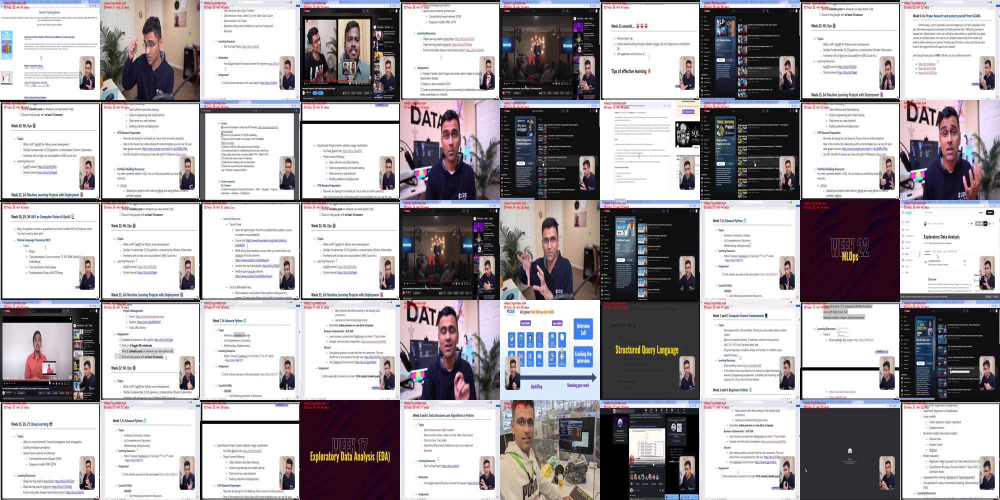

In [75]:
num_images_per_row = 10
num_images_per_col = 5
img_size = 200
start = 1

samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

# Load and resize the images
sample_images = [
    Image.open(image_file).resize((img_size, img_size)) for image_file in samples
]

# Paste the images onto the new image
for idx, img in enumerate(sample_images):
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

In [76]:
num_cores = multiprocessing.cpu_count()

print("Number of CPU cores =", num_cores)

Number of CPU cores = 2


In [77]:
def process_image(image_file, max_retries=20):
    """
    Process image with error management
    """
    num_retries = 0

    while num_retries < max_retries:
        try:
            embedding, response = image_embedding_batch(image_file)

            if response.status_code == 200:
                return embedding

            else:
                num_retries += 1
                print(
                    f"Error processing {image_file}: {response.status_code}.\
                Retrying... (attempt {num_retries} of {max_retries})"
                )

        except Exception as e:
            print(f"An error occurred while processing {image_file}: {e}")
            print(f"Retrying... (attempt {num_retries} of {max_retries})")
            num_retries += 1

    return None

In [78]:
def process_all_images(image_files, max_workers=4, max_retries=20):
    """
    Running the full process using pool
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        embeddings = list(
            tqdm(
                executor.map(lambda x: process_image(x, max_retries), image_files),
                total=len(image_files),
            )
        )

    return [emb for emb in embeddings if emb is not None]

In [79]:
print(
    datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"),
    "Starting to compute vector embeddings for our",
    "{:,}".format(len(image_files)),
    "catalog images...",
)
start = time.time()

# Running the images vector embeddings for all the images files
list_emb = process_all_images(image_files, max_workers=4, max_retries=20)

# End of job
print(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"), "Done")
elapsed = time.time() - start
print(f"\nElapsed time: {int(elapsed / 60)} minutes, {int(elapsed % 60)} seconds")
print("Number of processed images =", len(list_emb))
print(f"Processing time per image = {(elapsed / len(list_emb)):.5f} sec")

27-Apr-2024 05:07:51 Starting to compute vector embeddings for our 1,896 catalog images...


100%|██████████| 1896/1896 [06:06<00:00,  5.18it/s]

27-Apr-2024 05:13:58 Done

Elapsed time: 6 minutes, 6 seconds
Number of processed images = 1896
Processing time per image = 0.19326 sec


In [80]:
print(f"Number of images files = {len(image_files)}")
print(f"Number of vectors embeddings = {len(list_emb)}")

Number of images files = 1896
Number of vectors embeddings = 1896


In [81]:
JSON_DIR = "json"

os.makedirs(JSON_DIR, exist_ok=True)

In [82]:
print("Exporting images vector embeddings")

# Json filename
current_dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S"))
json_file = os.path.join(JSON_DIR, f"img_embed_{current_dt}.json")

# Saving vectors embeddings into this Json file
with open(json_file, "w") as f:
    json.dump(list_emb, f)

print("Done. Vector embeddings have been saved in:", json_file)

Exporting images vector embeddings
Done. Vector embeddings have been saved in: json/img_embed_27Apr2024_051523.json


In [83]:
# List of all Json files
json_list = [
    os.path.join(JSON_DIR, file)
    for file in os.listdir(JSON_DIR)
    if file.endswith(".json")
]

json_list

['json/img_embed_27Apr2024_051523.json']

In [84]:
print("Importing vectors embeddings...")

JSON_DIR = "json"

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_27Apr2024_051523.json

Done: number of imported vector embeddings = 1,896
